# Début de l'analyse

In [1]:
import sys, os

import requests
import csv
import json
import time

import pandas as pd
import geopandas as gpd

import numpy
import matplotlib.pyplot as plt
import seaborn as sb


# from google.colab import drive
# drive.mount('/content/drive')

df = pd.read_csv('data/export_all_indicators.csv',sep = ',')

print(df)

       fid  Id    feuille  surfac_m2     nature      surf2   perimeter  \
0        1   0  MM_unique       2523  parcelles   2523.370  245.985771   
1        2   0  MM_unique       1114  parcelles   1114.420  178.507759   
2        3   0  MM_unique       3914  parcelles   3913.950  301.515459   
3        4   0  MM_unique        546  parcelles    545.636  108.805883   
4        5   0  MM_unique       1247  parcelles   1247.450  143.229918   
...    ...  ..        ...        ...        ...        ...         ...   
4843  4844   0        EE2      34881  parcelles  34880.900  789.199828   
4844  4845   0        FF2      19686  parcelles  19686.400  686.023988   
4845  4846   5        JJ3        203       bati    203.270   63.243198   
4846  4847   0        JJ2      20995  parcelles  20995.300  286.327790   
4847  4848   0        JJ2       8312  parcelles   8312.200  464.697440   

      _cc_radius      _cc_area  _cc_circle_compacity  _comp_miller  \
0      50.282989   7943.136779           

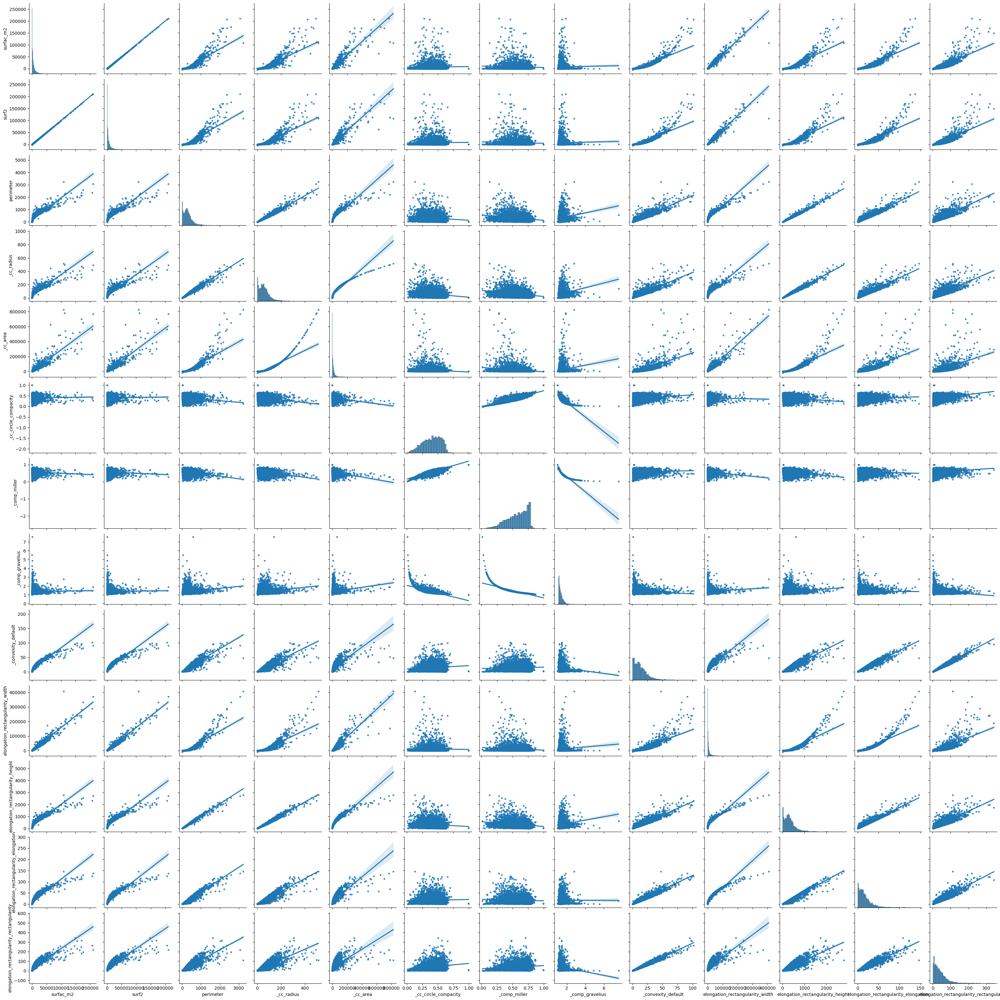

In [7]:
# df.drop(['#fid', 'Id, feuille'], axis=1, inplace=True)
df2 = df.drop(['fid','Id','feuille'], axis=1)
sb.pairplot(df2, markers='.', kind='reg')

# Exploration interactive

In [3]:
#!pip install pygwalker;

error: externally-managed-environment

× This environment is externally managed
╰─> To install Python packages system-wide, try apt install
    python3-xyz, where xyz is the package you are trying to
    install.
    
    If you wish to install a non-Debian-packaged Python package,
    create a virtual environment using python3 -m venv path/to/venv.
    Then use path/to/venv/bin/python and path/to/venv/bin/pip. Make
    sure you have python3-full installed.
    
    If you wish to install a non-Debian packaged Python application,
    it may be easiest to use pipx install xyz, which will manage a
    virtual environment for you. Make sure you have pipx installed.
    
    See /usr/share/doc/python3.12/README.venv for more information.

note: If you believe this is a mistake, please contact your Python installation or OS distribution provider. You can override this, at the risk of breaking your Python installation or OS, by passing --break-system-packages.
hint: See PEP 668 for the detai

In [ ]:
#!pip install pygwalker;
import pygwalker as pyg;

: 

In [ ]:
gwalker = pyg.walk(df)

Box(children=(HTML(value='\n<div id="ifr-pyg-00061d63c637786bHGiuaRTs8m7w0Z4I" style="height: auto">\n    <hea…

In [ ]:
df.head()

,fid,Id,feuille,surfac_m2,nature,surf2,perimeter,_cc_radius,_cc_area,_cc_circle_compacity,_comp_miller,_comp_gravelius,_convexity_default,elongation_rectangularity_width,elongation_rectangularity_height,elongation_rectangularity_elongation,elongation_rectangularity_rectangularity
0,1,0,MM_unique,2523,parcelles,2523.370,245.985771,50.282989,7943.136779,0.318,0.524,1.38,10.254,5046.742645,291.081637,17.338,28.490
1,2,0,MM_unique,1114,parcelles,1114.420,178.507759,30.163215,2858.282360,0.390,0.439,1.51,7.059,2215.183594,188.377319,11.759,22.860
2,3,0,MM_unique,3914,parcelles,3913.950,301.515459,56.487528,10024.322202,0.390,0.541,1.36,13.902,5303.865447,314.808600,16.848,36.050
3,4,0,MM_unique,546,parcelles,545.636,108.805883,22.589174,1603.062901,0.340,0.579,1.31,5.013,581.822182,113.274622,5.136,12.640
4,5,0,MM_unique,1247,parcelles,1247.450,143.229918,27.357759,2351.315602,0.530,0.764,1.14,8.706,1493.546911,154.672322,9.656,31.207


In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

# suppression des colonnes non numériques
WGI_num = df.drop(columns = ["fid", "Id", "feuille", "nature"])
pca = PCA()
pca.fit(WGI_num)

PCA()

In [ ]:
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

[2.89796356e+09 1.01294601e+08 1.23055518e+07 3.14926188e+04
 5.77389415e+02 1.53884346e+02 1.21311130e+01 1.57343302e+00
 1.03587103e+00 4.23813115e-02 4.05399195e-02 6.25952918e-03
 7.32454723e-04]
[9.62268381e-01 3.36348575e-02 4.08605671e-03 1.04571195e-05
 1.91722072e-07 5.10972750e-08 4.02813433e-09 5.22458207e-10
 3.43960825e-10 1.40727084e-11 1.34612744e-11 2.07847576e-12
 2.43211485e-13]


In [ ]:
eig = pd.DataFrame(
    {
        "Dimension" : ["Dim" + str(x + 1) for x in range(13)],
        "Variance expliquée" : pca.explained_variance_,
        "% variance expliquée" : numpy.round(pca.explained_variance_ratio_ * 100),
        "% cum. var. expliquée" : numpy.round(numpy.cumsum(pca.explained_variance_ratio_) * 100)
    }
)
eig

,Dimension,Variance expliquée,% variance expliquée,% cum. var. expliquée
0,Dim1,2.897964e+09,96.0,96.0
1,Dim2,1.012946e+08,3.0,100.0
2,Dim3,1.230555e+07,0.0,100.0
3,Dim4,3.149262e+04,0.0,100.0
4,Dim5,5.773894e+02,0.0,100.0
5,Dim6,1.538843e+02,0.0,100.0
6,Dim7,1.213111e+01,0.0,100.0
7,Dim8,1.573433e+00,0.0,100.0
8,Dim9,1.035871e+00,0.0,100.0
9,Dim10,4.238131e-02,0.0,100.0


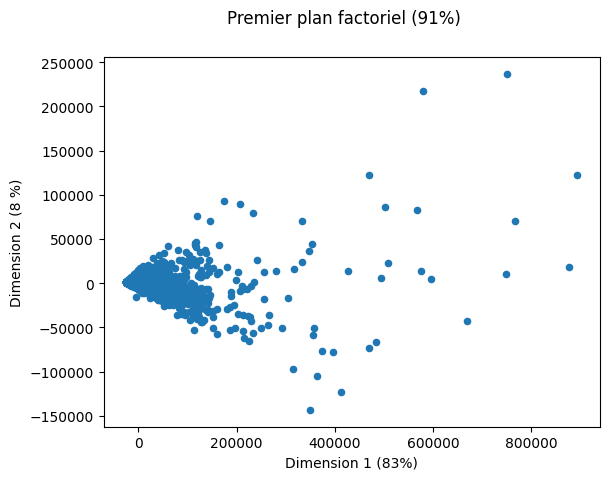

In [ ]:
WGI_pca = pca.transform(WGI_num)

WGI_pca_df = pd.DataFrame({
    "Dim1" : WGI_pca[:,0],
    "Dim2" : WGI_pca[:,1],
})


WGI_pca_df.plot.scatter("Dim1", "Dim2") # nuage de points
plt.xlabel("Dimension 1 (83%)") # modification du nom de l'axe X
plt.ylabel("Dimension 2 (8 %)") # idem pour axe Y
plt.suptitle("Premier plan factoriel (91%)") # titre général
plt.show()